In [1]:
from datetime import datetime
import matplotlib.pyplot as plt
import pandas as pd
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import MetaTrader5 as mt5
import plotly.graph_objects as go
from fastquant import backtest
import numpy as np



In [2]:
# connect to MetaTrader 5
if not mt5.initialize():
    print("initialize() failed")
    mt5.shutdown()

account = 66056949
# the terminal database password is applied if connection data is set to be remembered
authorized = mt5.login(account, server="XPMT5-DEMO")
if authorized:
    print("connected to account #{}".format(account))
else:
    print("failed to connect at account #{}, error code: {}".format(
        account, mt5.last_error()))

# request connection status and parameters
# get data on MetaTrader 5 version

# request ticks from AUDUSD within 2019.04.01 13:00 - 2019.04.02 13:00
timeframes = [
    # [
    #     mt5.TIMEFRAME_M1,
    #     "M1"
    # ],
    # [
    #     mt5.TIMEFRAME_M5,
    #     "M5"
    # ],
    [
        mt5.TIMEFRAME_M15, 
        "M15"
    ],
    # [
    #     mt5.TIMEFRAME_M30, 
    #     "M30"
    # ],
    # [
    #     mt5.TIMEFRAME_H1,
    #     "H1"
    # ],
    # [
    #     mt5.TIMEFRAME_H4,
    #     "H4"
    # ],
    [
        mt5.TIMEFRAME_D1,
        "D1"
    ],
]

stocks = [
    "PETR4",
    # "VALE3",
]
end_date = datetime(2021, 11, 1)

for stock in stocks:
    for timeframe in timeframes:
        rates = []
        rates = mt5.copy_rates_from(stock, timeframe[0], end_date, 10000)
        if len(rates):
            print(f"Tamanho dos dados de {stock}_{timeframe[1]}: {len(rates)}")
            rates_frame = pd.DataFrame(rates)
            rates_frame["time","low"].to_csv(f"./data/{stock}_{timeframe[1]}_low.csv",
                               index=False, header=None)
            rates_frame["time", "high"].to_csv(f"./data/{stock}_{timeframe[1]}_high.csv",
                               index=False, header=None)


# print(ibov_d1_rates)
# with open("test.csv",'w',encoding = 'utf-8') as f:
#   f.write(ibov_d1_rates)
# shut down connection to MetaTrader 5
mt5.shutdown()

# DATA


connected to account #66056949
Tamanho dos dados de PETR4_D1: 2526
Tamanho dos dados de VALE3_D1: 2499


True

In [5]:
teste = [1]
if teste:
    print("oi")

oi


In [5]:
petr4_m5_frame = pd.DataFrame(ibov_m5_rates)
petr4_m5_frame.to_csv("petr4.csv", index=False)

vale3_m5_frame = pd.DataFrame(ibov_d1_rates)
vale3_m5_frame["close"].to_csv("vale3_1d.csv", index=False, header=None)

In [39]:
,
# create DataFrame out of the obtained data
ibov_m15_frame = pd.DataFrame(ibov_m5_rates)
ibov_m15_frame['Date'] = pd.to_datetime(ibov_m15_frame['time'], unit='s')

ibov_m15_frame.head(30)


fig = go.Figure(data=[go.Candlestick(x=ibov_m15_frame['Date'],
                open=ibov_m15_frame['open'], high=ibov_m15_frame['high'],
                low=ibov_m15_frame['low'], close=ibov_m15_frame['close'])
                     ])

fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [4]:
#PLOT
# create DataFrame out of the obtained data
ibov_d1_frame = pd.DataFrame(ibov_d1_rates)
ibov_d1_frame['Date'] = pd.to_datetime(ibov_d1_frame['time'], unit='s')

ibov_d1_frame.head(30)


# fig = go.Figure(data=[go.Candlestick(x=ibov_d1_frame['Date'],
#                 open=ibov_d1_frame['open'], high=ibov_d1_frame['high'],
#                 low=ibov_d1_frame['low'], close=ibov_d1_frame['close'])
#                      ])

# fig.update_layout(xaxis_rangeslider_visible=True)
# fig.show()

,time,open,high,low,close,tick_volume,spread,real_volume,Date
0,1556755200,96339.0,96339.0,95312.0,95528.0,6875993,0,78416481683,2019-05-02
1,1556841600,95521.0,96315.0,95521.0,96008.0,30697321,0,366690138582,2019-05-03
2,1557100800,95992.0,95992.0,94540.0,95009.0,768382,0,7649111441,2019-05-06
3,1557187200,95009.0,95009.0,92750.0,94389.0,1156958,0,12049459312,2019-05-07
4,1557273600,94389.0,96312.0,94389.0,95597.0,1177269,0,12252442612,2019-05-08
5,1557360000,95597.0,95597.0,93883.0,94808.0,1033264,0,10709609944,2019-05-09
6,1557446400,94809.0,94848.0,93234.0,94258.0,1061364,0,10583834702,2019-05-10
7,1557705600,94252.0,94252.0,91600.0,91727.0,1146151,0,10805350968,2019-05-13
8,1557792000,91772.0,92529.0,91562.0,92092.0,987932,0,9872870196,2019-05-14
9,1557878400,92088.0,92088.0,90295.0,91623.0,1210094,0,11323434899,2019-05-15


Starting Portfolio Value: 100000.00
2021-09-30T16:45:00, ===Global level arguments===
2021-09-30T16:45:00, init_cash : 100000
2021-09-30T16:45:00, buy_prop : 1
2021-09-30T16:45:00, sell_prop : 1
2021-09-30T16:45:00, commission : 0
2021-09-30T16:45:00, stop_loss : 0
2021-09-30T16:45:00, stop_trail : 0
2021-09-30T16:45:00, take_profit : 0
===Strategy level arguments===
rsi_period : 14
rsi_upper : 70
rsi_lower : 30
2021-09-30T16:45:00, Final Portfolio Value: 138503.0
2021-09-30T16:45:00, Final PnL: 38503.0
Time used (seconds): 11.322650671005249
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['rsi']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	short_max:1.5	add_cash_amount:0	add_cash_freq:M	invest_div:True	rsi_period:14	rsi_upper:70	

<IPython.core.display.Javascript object>


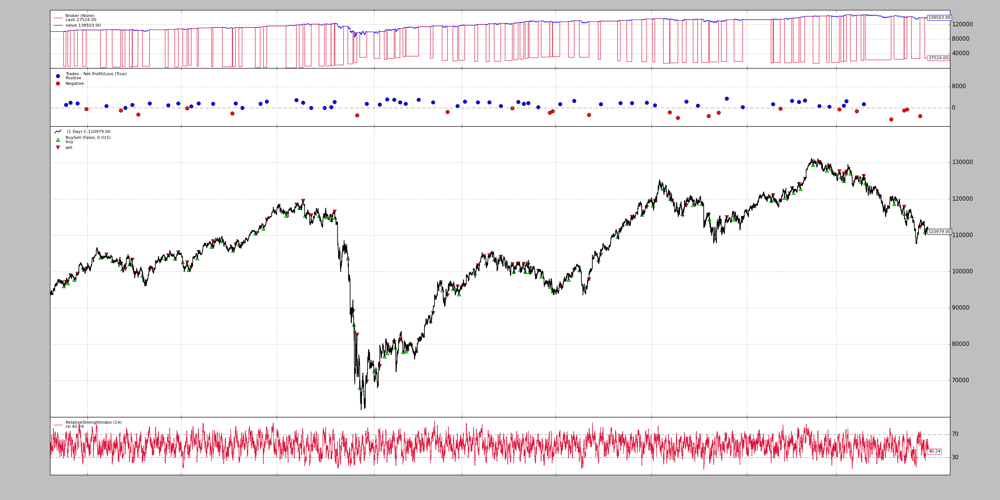

,strat_id,init_cash,buy_prop,sell_prop,fractional,commission,stop_loss,stop_trail,take_profit,execution_type,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0,0,0,0,close,...,60,25,1624.183333,1.624183,-2355.8,-2.3558,3524.0,3.524,-14564.0,-14.564


In [5]:
ibov_m15_frame["datetime"] = ibov_m15_frame["Date"]
df = ibov_m15_frame[["open","high",'low','close', 'datetime']]

backtest('rsi', ibov_m15_frame, rsi_period=14, rsi_upper=70, rsi_lower=30)
